<a href="https://colab.research.google.com/github/amelliaaas/PraktikumML_282-305/blob/main/Tugas%20Praktikum%20Modul%205%20(Model%202).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Soal Praktikum Overfitting Handling #3 dan #4**

## Kegiatan 1 **(Individu)** 
70 poin

**Peraturan :**
* Tidak boleh ada error dalam kode program
* Kali ini anda dibebaskan untuk memilih satu dataset untuk kasus klasifikasi citra penyakit (pada manusia, hewan atau tumbuhan) menggunakan model CNN.
* Pastikan bahwa dataset tersebut termasuk dataset Imbalance.
* Dalam modul ini tidak diperbolehkan menggunakan teknik transfer learning dari pretrain model baik yang di bangun sendiri atau anda dapatkan dari sumber lain (tensorflow, keras, dan sebagainya)
* **Disarankan menggunakan Google Colab** dengan jenis runtime **GPU**
* Perhatikan langkah demi langkah yang diperintahkan dalam kegiatan ini

### **SOAL 1 :** 
---
* Lakukan resampling dataset agar dataset anda menjadi seimbang. Anda dibebaskan menggunakan teknik resampling apapun. Jelaskan tentang cara kerja metode resampling yang anda gunakan kepada asisten
* Melakukan proses EDA sesuai dengan kondisi data yang anda gunakan. Jelaskan kepada asisten terkait temuan kondisi data anda dan cara penanganannya 
* Melakukan ujicoba model dengan menerapkan materi pada modul-modul sebelumnya. (regularization, hiperparameter tuning, lr scheduler, dll) 
* Melakuakn augmentasi data menggunakan teknik image processing seperti (random noise, clahe, usuyama, blur, atau yang lainnya) dan ImageDataGenerator
- Membangun 2 model dengan ketentuan :
 1. Model pertama menggabungkan minimal **2 kombinasi pretrained architectures** yang berbeda sebagai ekstraksi fitur. Training pembobotan dilakukan pada layer eksperiment dengan menerapkan improvisasi training pada modul sebelumnya. Referensi pretrained arsitektur yang terdapat pada keras dapat anda lihat di laman berikut: https://www.tensorflow.org/api_docs/python/tf/keras/applications
 2. Model kedua menggunakan sebuah pretrained model bebas dengan improvisasi anda sendiri. Anda dapat menggunakan improvisasi pada modul sebelumnya dengan menggunakan dropout, regulizer, early stopping, callback training, grid search, dsb.
* Setiap model dilatih dengan jumlah epoch minimal 150 epoch dan output layer wajib menggunakan `softmax`.
* Membuat evaluasi model berupa plot nilai akurasi dan loss, metric akurasi, f-measure, recall, presisi, dan confusion matrix.
* Membuat kode untuk melakukkan prediksi pada 10 gambar acak yang belum pernah dipelajari oleh model sebelumnya kemudian menampilkannya dalam sebuah plot *(poin tambahan jika bisa menampilkan nilai confidence prediksi gambar dan lama waktu prediksi gambar)*
* Menyimpan semua model dalam format `tflite`

<img src = "https://i.imgur.com/4iskeo2.png" align="center">
<br/>
<h4>Gambar 1. Rancangan Model<h4/>

# Preprocessing

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
%cd /content/drive/MyDrive/COVID-19_Radiography

/content/drive/MyDrive/COVID-19_Radiography


In [3]:
base_dir = "/content/drive/MyDrive/COVID-19_Radiography"
data_dir = "/content/drive/MyDrive/COVID-19_Radiography"

In [4]:
pip install split-folders

In [ ]:
import splitfolders
splitfolders.ratio(data_dir, output=base_dir, seed=1337, ratio=(.80, .20))

Copying files: 15158 files [03:21, 75.26 files/s]


In [4]:
!ls

 Covid	 modelku.hdf5	      Normal   val
 logs	 model_vgg19_1.hdf5   train   'Viral Pneumonia'


In [5]:
import os

def count(path):
  x = 0
  for root, dirs, files in os.walk(path):
    for f in files:
      x = x + 1
  return x

train_data = "/content/drive/MyDrive/COVID-19_Radiography/train"
validation_data = "/content/drive/MyDrive/COVID-19_Radiography/val"

print("Total Data Training : ", count(train_data))
print("Total Data Testing : ", count(validation_data))


Total Data Training :  2327
Total Data Testing :  583


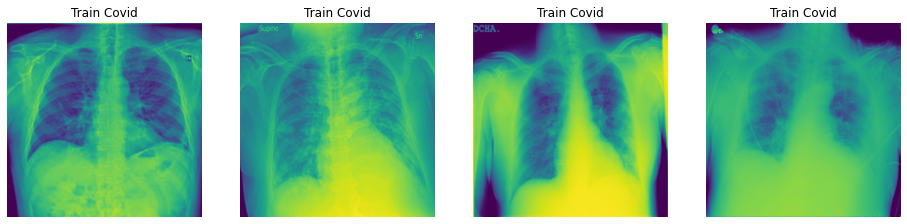

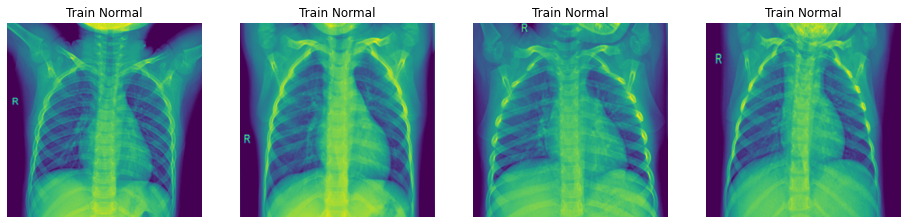

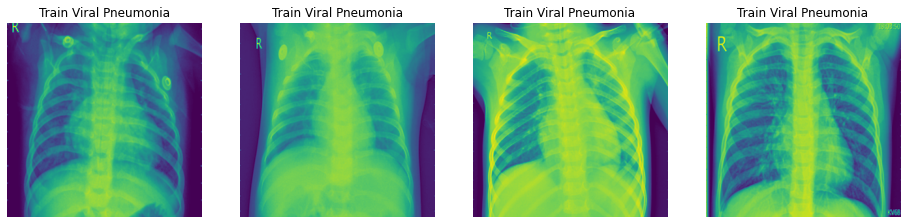

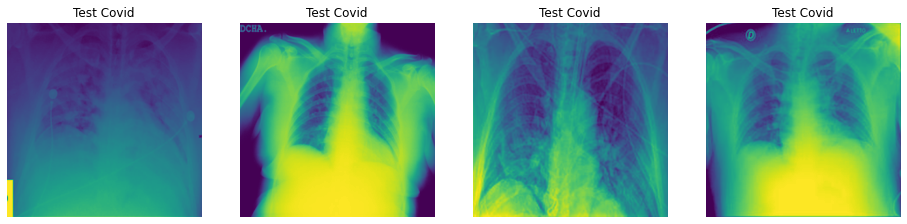

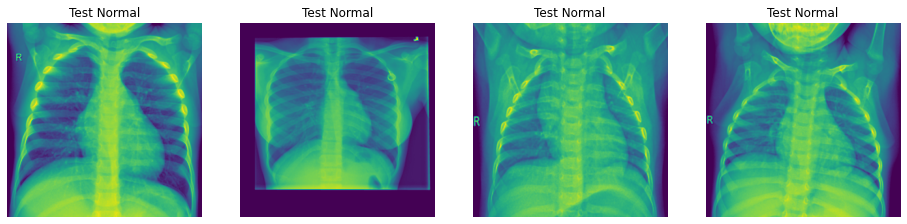

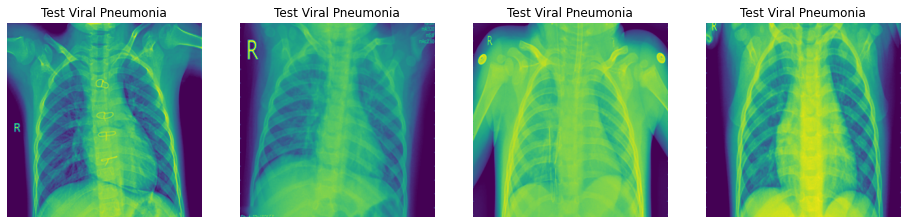

In [6]:
import matplotlib.pyplot as plt
import matplotlib.image as mping

a = os.path.join("/content/drive/MyDrive/COVID-19_Radiography/train/Covid")
b = os.path.join("/content/drive/MyDrive/COVID-19_Radiography/train/Normal")
c = os.path.join("/content/drive/MyDrive/COVID-19_Radiography/train/Viral Pneumonia")
d = os.path.join("/content/drive/MyDrive/COVID-19_Radiography/val/Covid")
e = os.path.join("/content/drive/MyDrive/COVID-19_Radiography/val/Normal")
f = os.path.join("/content/drive/MyDrive/COVID-19_Radiography/val/Viral Pneumonia")

i = os.listdir(a)
j = os.listdir(b)
k = os.listdir(c)
l = os.listdir(d)
m = os.listdir(e)
n = os.listdir(f)


fname1 = [os.path.join(a,fname)
        for fname in i[:4]]

fname2 = [os.path.join(b,fname)
        for fname in j[:4]]

fname3 = [os.path.join(c,fname)
        for fname in k[:4]]

fname4 = [os.path.join(d,fname)
        for fname in l[:4]]

fname5 = [os.path.join(e,fname)
        for fname in m[:4]]

fname6 = [os.path.join(f,fname)
        for fname in n[:4]]



ncolu = 4
nrow = 2
fig = plt.gcf()
fig.set_size_inches(ncolu*4,nrow*4)
for i,fname in enumerate(fname1):
    sp = plt.subplot(2,4,i+1)
    sp.axis('off')
    img = mping.imread(fname)
    plt.title('Train Covid')
    plt.imshow(img)
plt.show()

ncolu = 4
nrow = 2
fig = plt.gcf()
fig.set_size_inches(ncolu*4,nrow*4)
for i,fname in enumerate(fname2):
    sp = plt.subplot(2,4,i+1)
    sp.axis('off')
    img = mping.imread(fname)
    plt.title('Train Normal')
    plt.imshow(img)
plt.show()

ncolu = 4
nrow = 2
fig = plt.gcf()
fig.set_size_inches(ncolu*4,nrow*4)
for i,fname in enumerate(fname3):
    sp = plt.subplot(2,4,i+1)
    sp.axis('off')
    img = mping.imread(fname)
    plt.title('Train Viral Pneumonia')
    plt.imshow(img)
plt.show()

ncolu = 4
nrow = 2
fig = plt.gcf()
fig.set_size_inches(ncolu*4,nrow*4)
for i,fname in enumerate(fname4):
    sp = plt.subplot(2,4,i+1)
    sp.axis('off')
    img = mping.imread(fname)
    plt.title('Test Covid')
    plt.imshow(img)
plt.show()

ncolu = 4
nrow = 2
fig = plt.gcf()
fig.set_size_inches(ncolu*4,nrow*4)
for i,fname in enumerate(fname5):
    sp = plt.subplot(2,4,i+1)
    sp.axis('off')
    img = mping.imread(fname)
    plt.title('Test Normal')
    plt.imshow(img)
plt.show()

ncolu = 4
nrow = 2
fig = plt.gcf()
fig.set_size_inches(ncolu*4,nrow*4)
for i,fname in enumerate(fname6):
    sp = plt.subplot(2,4,i+1)
    sp.axis('off')
    img = mping.imread(fname)
    plt.title('Test Viral Pneumonia')
    plt.imshow(img)
plt.show()


In [7]:
from keras.preprocessing.image import ImageDataGenerator
from sklearn.utils import shuffle

augmen_gen = ImageDataGenerator(rescale=1. / 255,
                            rotation_range=40,
                            width_shift_range=0.2,
                            height_shift_range=0.2,
                            shear_range=0.2,
                            zoom_range=0.2,
                            horizontal_flip=True,
                            fill_mode='nearest')

train_gen = augmen_gen.flow_from_directory(
    train_data,
    class_mode = 'categorical',
    shuffle=True,
    target_size = (128,128),
    batch_size=32,
    color_mode ='rgb'
)

aug=ImageDataGenerator(rescale=1. / 255)
val_gen = aug.flow_from_directory(
    validation_data,
    class_mode = 'categorical',
    shuffle=False,
    target_size = (128,128),
    batch_size=32,
    color_mode ='rgb'
)


Found 2327 images belonging to 3 classes.
Found 583 images belonging to 3 classes.


# Modelling


In [8]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Flatten, Dropout, Input, concatenate, GlobalMaxPooling2D
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.vgg19 import VGG19

input = (128, 128, 3)
input_model = Input(shape=input)

vgg16 = VGG16(include_top=False, input_shape = input)(input_model)
vgg19 = VGG19(include_top=False, input_shape = input)(input_model)
resnet = ResNet50(include_top=False, input_shape = input)(input_model)

def combinemodel(m1, m2):
  model = concatenate([m1, m2])
  model = GlobalMaxPooling2D()(model)
  model = Flatten(name="flatten")(model)
  model = Dense(256, activation="relu")(model)
  model = Dropout(0.2)(model)
  model = Dense(64, activation="relu")(model)
  model = Dropout(0.2)(model)
  model = Dense(3, activation="softmax")(model)
  return model

vgg16.trainable = False
vgg19.trainable = False
resnet.trainable = False

94781440/94765736 [==============================] - 1s 0us/step


In [9]:
# Hasil pengerjaan point 2.1 (model 1)

sc1 = combinemodel(vgg16, resnet)
model1 = Model(inputs = input_model, outputs = sc1)
model1.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 vgg16 (Functional)             (None, 4, 4, 512)    14714688    ['input_1[0][0]']                
                                                                                                  
 resnet50 (Functional)          (None, 4, 4, 2048)   23587712    ['input_1[0][0]']                
                                                                                                  
 concatenate (Concatenate)      (None, 4, 4, 2560)   0           ['vgg16[0][0]',              

In [10]:
import tensorflow as tf
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau

tensorboard=tf.keras.callbacks.TensorBoard(log_dir='./logs/aug')

%load_ext tensorboard

!rm -rf ./logs/aug


def callback(path):
  checkpoint_callback = ModelCheckpoint(path,
                                      monitor='val_accuracy',
                                      save_best_only=True,
                                      verbose=1)
  reduce_callback = ReduceLROnPlateau(monitor='val_accuracy', patience=3, factor=0.5, min_lr=0.000001, verbose=1)
  callbacks_list = [checkpoint_callback, reduce_callback]
  return callbacks_list


In [11]:
# Hasil pengerjaan point 2.2 (model 1)
from tensorflow.keras.optimizers import Adam

best_model_path = 'best_model_kelompok.h5'
cback1=callback(best_model_path)

model1.compile(loss='categorical_crossentropy',
             optimizer=Adam(lr=0.001),
             metrics='accuracy')

Comp1 = model1.fit(train_gen, epochs=10,validation_data=val_gen, verbose=1, callbacks=[tensorboard,cback1])

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)
/usr/local/lib/python3.7/dist-packages/keras/engine/functional.py:1410: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  layer_config = serialize_layer_fn(layer)


Epoch 1/10
73/73 [==============================] - ETA: 0s - loss: 1.5113 - accuracy: 0.7035
Epoch 00001: val_accuracy improved from -inf to 0.46141, saving model to best_model_kelompok.h5
73/73 [==============================] - 422s 5s/step - loss: 1.5113 - accuracy: 0.7035 - val_loss: 1856288.8750 - val_accuracy: 0.4614 - lr: 0.0010
Epoch 2/10
73/73 [==============================] - ETA: 0s - loss: 1.1756 - accuracy: 0.7331
Epoch 00002: val_accuracy improved from 0.46141 to 0.46312, saving model to best_model_kelompok.h5
73/73 [==============================] - 48s 651ms/step - loss: 1.1756 - accuracy: 0.7331 - val_loss: 1.0301 - val_accuracy: 0.4631 - lr: 0.0010
Epoch 3/10
73/73 [==============================] - ETA: 0s - loss: 0.5954 - accuracy: 0.7942
Epoch 00003: val_accuracy did not improve from 0.46312
73/73 [==============================] - 42s 564ms/step - loss: 0.5954 - accuracy: 0.7942 - val_loss: 1.6221 - val_accuracy: 0.0755 - lr: 0.0010
Epoch 4/10
73/73 [===========

# Report

In [14]:
from tensorflow.keras.models import load_model

model_1 = load_model("best_model_kelompok.h5")

In [13]:
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np

ypred1 = model_1.predict(val_gen)
predictions = np.argmax(ypred1, axis = 1)
# labels = (ypred1 > 0.5).astype(np.int)
labels = ['Covid','Normal','Viral Pneumonia']
print("Classification Report Model Pertama:")
print(classification_report(val_gen.classes,predictions,target_names=labels))

Classification Report Model Pertama:
                 precision    recall  f1-score   support

          Covid       0.00      0.00      0.00        44
         Normal       0.00      0.00      0.00       269
Viral Pneumonia       0.46      1.00      0.63       270

       accuracy                           0.46       583
      macro avg       0.15      0.33      0.21       583
   weighted avg       0.21      0.46      0.29       583



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [15]:
# Hasil pengerjaan point 3.3

%tensorboard --logdir logs/aug

<IPython.core.display.Javascript object>

**Contoh prediksi 10 gambar baru**

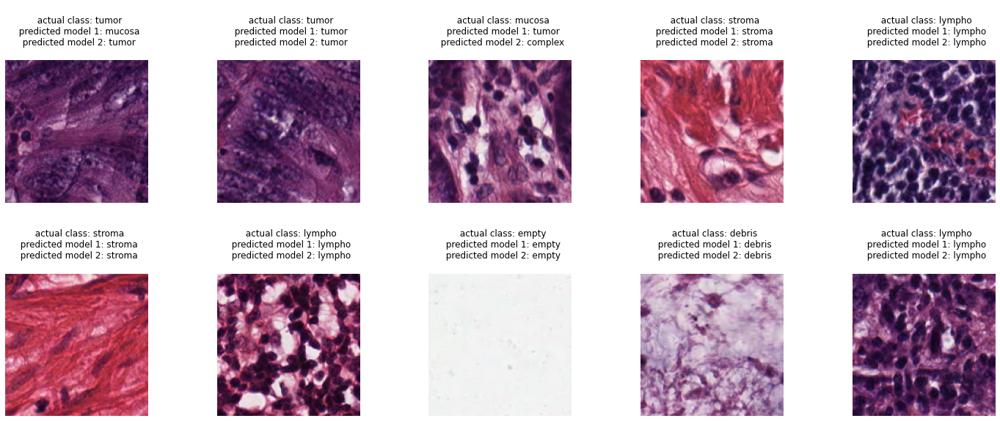

## Kegiatan 2 **(berkelompok)**
30 poin

**Ketentuan Wajib**
* Tulis dokumentasi tugas kelompok anda dalam file README.md
* Cek daftar dataset seluruh praktikan [disini](https://docs.google.com/spreadsheets/d/1qyu5AVDhPhegpRTbNaDoq5qXX4_CX09Q7tYyD-fkF_c/edit?usp=sharing)
* Seluruh data dan progress pengerjaan tugas kelompok harus berada dalam github repository sebelum praktikum dimulai
* Tidak diperbolehkan berganti anggota kelompok selama satu semester ini
* Tidak diperbolehkan berganti repository selama mengerjakan tugas kelompok ini
* **Tidak diperbolehkan berganti dataset atau jurnal rujukan**
* Pastikan anda menggunakan akun github pribadi untuk melakukan commit dan push

**Penilaian**
* Keaktifan dalam tim
* Kontribusi dalam proyek dan tim
* Penerapan prinsip kerja Agile (sprint backlog dan report terdokumentasikan dengan baik)
* Progress pengerjaan tugas kelompok
* Problem solving masing - masing anggota terhadap kendala yang dialami
* Pemahaman masing - masing anggota tim terhadap tugas yang dikerjakan
* Pendokumentasian proyek "clear and clean documentation"

**Materi pendukung**
* [Project documentation](https://realpython.com/documenting-python-code)
* [Github readme](https://docs.github.com/en/github/writing-on-github/getting-started-with-writing-and-formatting-on-github/basic-writing-and-formatting-syntax)
* [Sprint backlog](https://www.lucidchart.com/blog/how-to-develop-a-product-backlog-in-agile)

**Tugas**

Melanjutkan tugas kelompok di modul 1 sampai 3 sekarang kerjakan beberapa poin berikut untuk didemokan kepada asisten masing-masing.

*   Melakukan proses preprocessing dataset dengan ketentuan:
 * augmentasi data menggunakan ImageDataGenerator dan salah satu augmentasi opsional lain seperti (random noise, clahe, usuyama, blur, atau yang lainnya)
 * balancing dataset menggunakan teknik oversampling / downsampling
 * splitting dataset menjadi (75% train, 14% validation, 1% test)
*   Melakukan training beberapa skema model menggunakan pretrained model **(minimal 2 model)** dengan 100 epoch per model
* Menyimpan model yang telah di training kedalam file `.tflite`  [Lihat disini](https://www.tensorflow.org/lite/convert)
*  Mencatat hasil perkembangan tugas kelompok dalam file `sprint_project.xlsx` tandai masing-masing task dengan status **Done** *untuk task yang telah selesai dikerjakan*, **On Going** *untuk task yang dalam proses pengerjaan*, **Waiting** *untuk task yang belum atau akan dikerjakan*
* Pastikan anda menulis tanggal mulai dan tanggal selesai masing-masing task dengan benar
* Pastikan anda menulis penanggung jawab masing-masing task (Penanggung jawab bertugas menyelesaikan dan menuntaskan masing-masing task yang diberikan)
* `commit` dan `push` seluruh perkerjaan yang anda lakukan kedalam branch pribadi dalam repository tugas kelompok yang telah anda buat sebelumnya.
* Presentasikan kepada asisten tentang apa yang anda lakukakan selama mengerjakan tugas kelompok ini. Ceritakan tentang tugas masing-masing anggota,  kendala dalam mengerjakan tugas sampai solusi yang anda lakukan saat mengerjakan tugas kelompok ini.

